In [4]:
import os
import torch
import tqdm
import numpy as np
import pandas as pd
from PIL import Image
import torch.nn as nn
import matplotlib.pyplot as plt
from collections import Counter
import torchvision.transforms as transforms
import matplotlib.patches as patches
from torch.utils.data import Dataset, DataLoader

In [5]:
torch.cuda.get_device_name()

'Tesla T4'

In [6]:
def intersection_over_union(boxes_preds, boxes_labels, box_format="midpoint"):
    # [x, y, w, h]

    if box_format == "midpoint":
        box1_x1 = boxes_preds[..., 0:1] - boxes_preds[..., 2:3] / 2
        box1_y1 = boxes_preds[..., 1:2] - boxes_preds[..., 3:4] / 2
        box1_x2 = boxes_preds[..., 0:1] + boxes_preds[..., 2:3] / 2
        box1_y2 = boxes_preds[..., 1:2] + boxes_preds[..., 3:4] / 2
        box2_x1 = boxes_labels[..., 0:1] - boxes_labels[..., 2:3] / 2
        box2_y1 = boxes_labels[..., 1:2] - boxes_labels[..., 3:4] / 2
        box2_x2 = boxes_labels[..., 0:1] + boxes_labels[..., 2:3] / 2
        box2_y2 = boxes_labels[..., 1:2] + boxes_labels[..., 3:4] / 2

    elif box_format == "corners":
        box1_x1 = boxes_preds[..., 0:1]
        box1_y1 = boxes_preds[..., 1:2]
        box1_x2 = boxes_preds[..., 2:3]
        box1_y2 = boxes_preds[..., 3:4]
        box2_x1 = boxes_labels[..., 0:1]
        box2_y1 = boxes_labels[..., 1:2]
        box2_x2 = boxes_labels[..., 2:3]
        box2_y2 = boxes_labels[..., 3:4]

    x1 = torch.max(box1_x1, box2_x1)
    y1 = torch.max(box1_y1, box2_y1)
    x2 = torch.min(box1_x2, box2_x2)
    y2 = torch.min(box1_y2, box2_y2)

    intersection_area = (x2 - x1).clamp(0) * (y2 - y1).clamp(0)
    box1_area = abs((box1_x2 - box1_x1) * (box1_y2 - box1_y1))
    box2_area = abs((box2_x2 - box2_x1) * (box2_y2 - box2_y1))

    return intersection_area / (box1_area + box2_area - intersection_area + 1e-6)

In [7]:
def non_max_supression(bboxes, iou_threshold, prob_threshold, box_format="midpoint"):
    # [pred_class, prob_score, x, y, w, h]

    bboxes = [box for box in bboxes if box[1] > prob_threshold]
    bboxes = sorted(bboxes, key=lambda x: x[1], reverse=True)
    final_bboxes = []

    while bboxes:
        curr_box = bboxes.pop(0)
        bboxes = [box for box in bboxes if box[0] != curr_box[0]
                  or intersection_over_union(torch.tensor(curr_box[2:]), torch.tensor(box[2:]),box_format) < iou_threshold]

        final_bboxes.append(curr_box)

    return final_bboxes

In [8]:
def mean_average_precision(pred_boxes, true_boxes, iou_threshold=0.5, box_format="midpoint", num_classes=20):
    # [img_idx, pred_class, prob_score, x, y, w, h]

    epsilon = 1e-6
    avg_precis = []

    for i in range(num_classes):
        detections = []
        ground_truths = []

        for pred_box, true_box in zip(pred_boxes, true_boxes):
            if pred_box[1] == i:
                detections.append(pred_box)

            if true_box[1] == i:
                ground_truths.append(true_box)

        bbox_counter = Counter([gt[0] for gt in ground_truths])
        for key, val in bbox_counter.items():
            bbox_counter[key] = torch.zeros(val)

        detections.sort(key=lambda x: x[2], reverse=True)
        true_positives = torch.zeros(len(detections))
        false_positives = torch.zeros(len(detections))
        total_true_bboxes = len(ground_truths)

        for detection_idx, detection in enumerate(detections):
            gt_img_bboxes = [bbox for bbox in ground_truths if bbox[0] == detection[0]]
            num_gt_bboxes = len(gt_img_bboxes)
            best_iou = 0

            for idx, gt in enumerate(gt_img_bboxes):
                iou = intersection_over_union(torch.tensor(detection[3:]), torch.tensor(gt[3:]), box_format)
                if iou > best_iou:
                    best_iou = iou
                    best_gt_idx = idx

            if best_iou > iou_threshold:
                if bbox_counter[detection[0]][best_gt_idx] == 0:
                    true_positives[detection_idx] = 1
                else:
                    false_positives[detection_idx] = 1
            else:
                false_positives[detection_idx] = 1

        tp_cumsum = torch.cumsum(true_positives, dim=0)
        fp_cumsum = torch.cumsum(false_positives, dim=0)

        precisions = tp_cumsum / (tp_cumsum + fp_cumsum + epsilon)
        recalls = tp_cumsum / (total_true_bboxes + epsilon)
        precisions = torch.cat((torch.tensor([1]), precisions))
        recalls = torch.cat((torch.tensor([0]), recalls))
        avg_precis.append(torch.trapz(precisions, recalls))

    mAP = sum(avg_precis) / len(avg_precis)
    return mAP

In [9]:
def convert_cellboxes(preds, s=7):
    preds = preds.to("cpu")
    bs = preds.shape[0]
    preds = preds.reshape(bs, 7, 7, 30)

    bbox1 = preds[..., 21:25]
    bbox2 = preds[..., 26:30]
    scores = torch.cat((preds[..., 20].unsqueeze(0), preds[..., 25].unsqueeze(0)), dim=0)

    best_idx = scores.argmax(0).unsqueeze(-1)
    best_box = bbox1 * (1 - best_idx) + best_idx * bbox2

    cell_indices = torch.arange(7).repeat(bs, 7, 1).unsqueeze(-1)
    x = 1 / s * (best_box[..., :1] + cell_indices)
    y = 1 / s * (best_box[..., 1:2] + cell_indices.permute(0, 2, 1, 3))
    wh = 1 / s * best_box[..., 2:4]
    converted_bbox = torch.cat((x, y, wh), dim=-1)

    pred_class = preds[..., :20].argmax(-1).unsqueeze(-1)
    best_prob = torch.max(preds[..., 20], preds[..., 25]).unsqueeze(-1)

    converted_preds = torch.cat(
        (pred_class, best_prob, converted_bbox), dim=-1)

    return converted_preds

In [10]:
def cellboxes_to_boxes(preds, s=7):
    bs = preds.shape[0]
    converted_preds = convert_cellboxes(preds, s).reshape(bs, s * s, -1)
    converted_preds[..., 0] = converted_preds[..., 0].long()
    all_bboxes = []

    for i in range(bs):
        bboxes = []
        for j in range(s * s):
            bboxes.append([x.item() for x in converted_preds[i, j, :]])

        all_bboxes.append(bboxes)

    return all_bboxes

In [11]:
def get_bboxes(net, batches, iou_threshold, prob_threshold, device, box_format="midpoint"):
    net.eval()
    all_pred_bboxes = []
    all_true_bboxes = []
    img_idx = 0

    for X, y in batches:
        X = X.to(device)
        y = y.to(device)

        with torch.no_grad():
            preds = net(X)

        bs = preds.shape[0]
        pred_bboxes = cellboxes_to_boxes(preds)
        true_bboxes = cellboxes_to_boxes(y)

        for i in range(bs):
            nms_bboxes = non_max_supression(pred_bboxes[i], iou_threshold, prob_threshold, box_format)

            for nms_bbox in nms_bboxes:
                all_pred_bboxes.append([img_idx] + nms_bbox)

            for true_bbox in true_bboxes[i]:
                if true_bbox[1] > prob_threshold:
                    all_true_bboxes.append([img_idx] + true_bbox)

            img_idx += 1

    net.train()

    return all_pred_bboxes, all_true_bboxes

In [12]:
def plot_image(img, bboxes, class_dict=None):
    img = np.array(img)
    h, w, c = img.shape

    fig, ax = plt.subplots(1)
    ax.imshow(img)

    for bbox in bboxes:
        if class_dict is not None:
            pred_class = class_dict[int(bbox[0])]
        else:
            pred_class = int(bbox[0])

        prob_score = bbox[1]
        bbox = bbox[2:]
        upper_left_x = bbox[0] - bbox[2] / 2
        upper_left_y = bbox[1] - bbox[3] / 3

        rectangle = patches.Rectangle((upper_left_x * w, upper_left_y * h), bbox[2] * w, bbox[3] * h,
                                      linewidth=2, edgecolor="r", facecolor="none")
        label_patch = patches.Rectangle((upper_left_x * w, (upper_left_y * h) - 25), (bbox[2] * w) * 2 / 3, 25, 
                                        alpha=1.0, color="r")

        ax.add_patch(rectangle)
        ax.add_patch(label_patch)
        plt.text(upper_left_x * w, (upper_left_y * h) - 10, f"{pred_class}({prob_score:.2f})")

    plt.show()

In [13]:
def save_checkpoint(net, opt, filename):
    check_point = {"net_dict": net.state_dict(), "opt_dict": opt.state_dict()}
    torch.save(check_point, filename)
    print("Checkpoint Saved!")
    print("")

def load_checkpoint(net, opt, filename):
    check_point = torch.load(filename)
    net.load_state_dict(check_point["net_dict"])
    opt.load_state_dict(check_point["opt_dict"])
    print("Checkpoint Loaded!")
    print("")

In [14]:
class LoadDataset(Dataset):
    def __init__(self, csv_file, img_dir, label_dir, transform, s=7, b=2, c=20):
        self.df = pd.read_csv(csv_file)
        self.img_dir = img_dir
        self.label_dir = label_dir
        self.transform = transform
        self.s = s
        self.b = b
        self.c = c

    def __len__(self):
        return len(self.df)

    def __getitem__(self, index):
        boxes = []
        label_path = os.path.join(self.label_dir, self.df.iloc[index, 1])

        with open(label_path) as f:
            for label in f.readlines():
                class_label, x, y, w, h = [float(i) if float(i) != int(float(i)) else int(i) for i in label.replace("n", "").split()]
                boxes.append([class_label, x, y, w, h])

        boxes = torch.tensor(boxes)
        img_path = os.path.join(self.img_dir, self.df.iloc[index, 0])
        img = Image.open(img_path)
        if self.transform:
            img, boxes = self.transform(img, boxes)

        label = torch.zeros((self.s, self.s, self.c + (self.b * 5)))
        for box in boxes:
            class_label, x, y, w, h = box.tolist()
            class_label = int(class_label)

            i, j = int(self.s * y), int(self.s * x)
            x_cell, y_cell, w_cell, h_cell = self.s * x - j, self.s * y - i, self.s * w, self.s * h

            if label[i, j, 20] == 0:
                label[i, j, 20] = 1
                label[i, j, class_label] = 1
                label[i, j, 21:25] = torch.tensor([x_cell, y_cell, w_cell, h_cell])

        return img, label

In [15]:
architecture = [(7, 64, 2, 3),
                "M",
                (3, 192, 1, 1),
                "M",
                (1, 128, 1, 0),
                (3, 256, 1, 1),
                (1, 256, 1, 0),
                (3, 512, 1, 1),
                "M",
                [(1, 256, 1, 0), (3, 512, 1, 1), 4],
                (1, 512, 1, 0),
                (3, 1024, 1, 1),
                "M",
                [(1, 512, 1, 0), (3, 1024, 1, 1), 2],
                (3, 1024, 1, 1),
                (3, 1024, 2, 1),
                (3, 1024, 1, 1),
                (3, 1024, 1, 1)]

In [16]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, **kwargs):
        super().__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, bias=False, **kwargs)
        self.batchnorm = nn.BatchNorm2d(out_channels)
        self.leakyrelu = nn.LeakyReLU(0.1)

    def forward(self, x):
        return self.leakyrelu(self.batchnorm(self.conv(x)))

In [17]:
class YoloNet(nn.Module):
    def __init__(self, in_channels=3, architecture=architecture, **kwargs):
        super().__init__()
        self.darknet = self.get_darknet(in_channels, architecture)
        self.fc_layers = self.get_fc_layers(**kwargs)

    def get_darknet(self, in_channels, architecture):
        layers = []

        for a in architecture:
            if type(a) == tuple:
                layers += [ConvBlock(in_channels, a[1], kernel_size=a[0], stride=a[2], padding=a[3])]
                in_channels = a[1]

            elif type(a) == str:
                layers += [nn.MaxPool2d(kernel_size=(2, 2), stride=(2, 2))]

            elif type(a) == list:
                conv1 = a[0]
                conv2 = a[1]
                num_repeats = a[2]

                for _ in range(num_repeats):
                    layers += [ConvBlock(in_channels, conv1[1], kernel_size=conv1[0], stride=conv1[2], padding=conv1[3])]
                    layers += [ConvBlock(conv1[1], conv2[1], kernel_size=conv2[0], stride=conv2[2], padding=conv2[3])]
                    in_channels = conv2[1]

        return nn.Sequential(*layers)

    def get_fc_layers(self, split_size, num_boxes, num_classes):
        s, b, c = split_size, num_boxes, num_classes
        layers = nn.Sequential(nn.Flatten(),
                               nn.Linear(1024 * s * s, 496),
                               nn.LeakyReLU(0.1),
                               nn.Linear(496, s * s * (c + (b * 5))))

        return layers

    def forward(self, x):
        return self.fc_layers(torch.flatten(self.darknet(x), start_dim=1))

In [18]:
class LossFn(nn.Module):
    def __init__(self, s=7, b=2, c=20):
        super().__init__()
        self.s = s
        self.b = b
        self.c = c
        self.mse = nn.MSELoss(reduction="sum")
        self.lambda_coord = 5
        self.lambda_noobj = 0.5

    def forward(self, preds, targets):
        preds = preds.reshape(-1, self.s, self.s, self.c + self.b * 5)

        iou_b1 = intersection_over_union(preds[..., 21:25], targets[..., 21:25])
        iou_b2 = intersection_over_union(preds[..., 26:30], targets[..., 21:25])
        ious = torch.cat([iou_b1.unsqueeze(0), iou_b2.unsqueeze(0)], dim=0)

        max_iou, best_box = torch.max(ious, dim=0)
        box_exists = targets[..., 20].unsqueeze(3)

        box_preds = box_exists * (best_box * preds[..., 26:30] + (1 - best_box) * preds[..., 21:25])
        box_targets = box_exists * targets[..., 21:25]

        box_preds[..., 2:4] = torch.sign(
            box_preds[..., 2:4]) * torch.sqrt(torch.abs(box_preds[..., 2:4] + 1e-6))
        box_targets[..., 2:4] = torch.sqrt(box_targets[..., 2:4])

        box_loss = self.mse(torch.flatten(box_preds, end_dim=-2),
                            torch.flatten(box_targets, end_dim=-2))

        pred_box = best_box * preds[..., 25:26] + (1 - best_box) * preds[..., 20:21]

        object_loss = self.mse(torch.flatten(box_exists * pred_box),
                               torch.flatten(box_exists * targets[..., 20:21]))

        no_object_loss = self.mse(torch.flatten((1 - box_exists) * preds[..., 20:21], start_dim=1),
                                  torch.flatten((1 - box_exists) * targets[..., 20:21], start_dim=1))

        no_object_loss += self.mse(torch.flatten((1 - box_exists) * preds[..., 25:26], start_dim=1),
                                   torch.flatten((1 - box_exists) * targets[..., 20:21], start_dim=1))

        class_loss = self.mse(torch.flatten(box_exists * preds[..., :20], end_dim=-2),
                              torch.flatten(box_exists * targets[..., :20], end_dim=-2))

        loss = self.lambda_coord * box_loss + object_loss + self.lambda_noobj * no_object_loss + class_loss

        return loss

In [19]:
class Compose(object):
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, img, bbox):
        for t in self.transforms:
            img, bbox = t(img), bbox

        return img, bbox

In [20]:
def loop(batches, net, opt, loss_fn, train, device):
    epoch_loss = []

    if train:
        net.train()
        print("Train Loop:")
        print("")

        for X, y in tqdm.tqdm(batches, total=len(batches)):
            X = X.to(device)
            y = y.to(device)

            output = net(X)
            loss = loss_fn(output, y)

            opt.zero_grad()
            loss.backward()
            opt.step()
            epoch_loss.append(loss.item())

    else:
        net.eval()
        print("Test Loop:")
        print("")

        with torch.no_grad():
            for X, y in tqdm.tqdm(batches, total=len(batches)):
                X = X.to(device)
                y = y.to(device)

                output = net(X)
                loss = loss_fn(output, y)
                epoch_loss.append(loss.item())

    print("")
    print("")
    
    return sum(epoch_loss) / len(epoch_loss)

In [21]:
def display_images(batches, net, class_dict=None):
    net.eval()
    print("Displaying images...")
    print("")
    for X, y in batches:
        X = X.to(device)

        for i in range(10):
            bboxes = net(X)
            bboxes = cellboxes_to_boxes(bboxes)
            bboxes = non_max_supression(bboxes[i], iou_threshold=0.5,
                                        prob_threshold=0.4)
            img = X[i].permute(1, 2, 0).to("cpu")
            plot_image(img, bboxes, class_dict)

        break

In [22]:
lr = 2e-5
device = "cuda" if torch.cuda.is_available() else "cpu"
batch_size = 16
epochs = 100
img_dir = "sample_pascal_voc/images"
label_dir = "sample_pascal_voc/labels"

In [23]:
device

'cuda'

In [24]:
class_dict = {0: "aeroplane", 1: "bicycle", 2: "bird", 3: "boat", 4: "bottle", 
              5: "bus", 6: "car", 7: "cat", 8: "chair", 9: "cow", 
              10: "diningtable", 11: "dog", 12: "horse", 13: "motorbike", 14: "human", 
              15: "plant", 16: "sheep", 17: "sofa", 18: "train", 19: "monitor"}

In [25]:
transform = Compose([transforms.Resize((448, 448)),
                     transforms.ToTensor()])

In [26]:
train_data = LoadDataset("sample_pascal_voc/1500examples.csv", img_dir, label_dir, transform)
# test_data = LoadDataset("pascal_voc/test.csv", img_dir, label_dir, transform=None)

In [27]:
len(train_data)

1515

In [28]:
train_batches = DataLoader(train_data, batch_size=batch_size, num_workers=2, pin_memory=True, shuffle=True, drop_last=True)
# test_batches = DataLoader(test_data, batch_size=batch_size, num_workers=2, pin_memory=True, shuffle=True, drop_last=True)

In [29]:
len(train_batches)

94

In [30]:
net = YoloNet(split_size=7, num_boxes=2, num_classes=20).to(device)
net

YoloNet(
  (darknet): Sequential(
    (0): ConvBlock(
      (conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (batchnorm): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (leakyrelu): LeakyReLU(negative_slope=0.1)
    )
    (1): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (2): ConvBlock(
      (conv): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (batchnorm): BatchNorm2d(192, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (leakyrelu): LeakyReLU(negative_slope=0.1)
    )
    (3): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
    (4): ConvBlock(
      (conv): Conv2d(192, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (batchnorm): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (leakyrelu): LeakyReLU(negative_slope=0.1

In [31]:
loss_fn = LossFn()
opt = torch.optim.Adam(net.parameters(), lr)

  0%|          | 0/94 [00:00<?, ?it/s]

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.57it/s]

 epoch: 0 | train_loss: 484.7217131269739 | train_mAP: 0.000701240380294621

Displaying images...



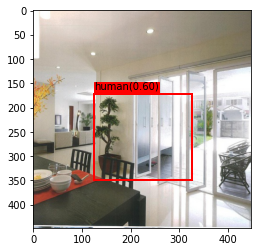

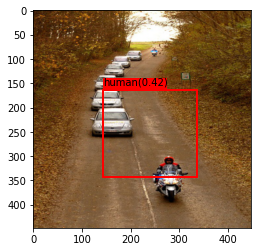

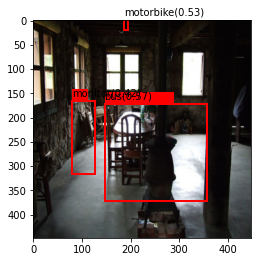

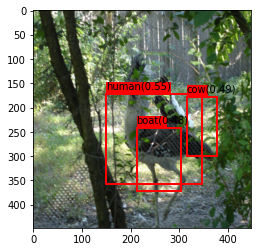

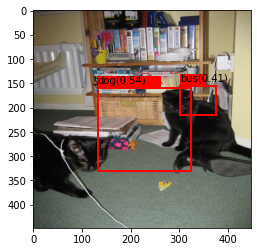

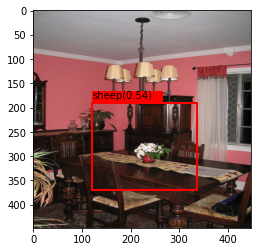

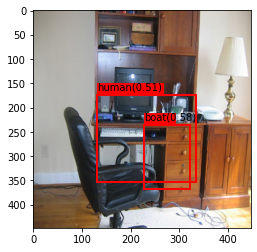

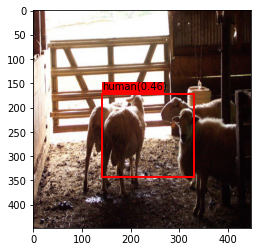

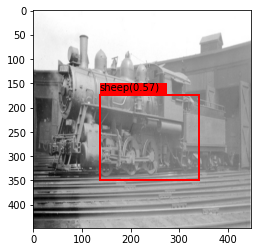

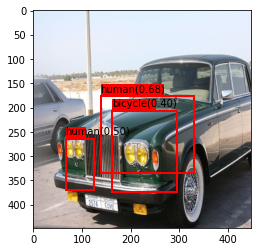

  0%|          | 0/94 [00:00<?, ?it/s]

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.58it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 1 | train_loss: 236.84013123207905 | train_mAP: 0.0006197094335220754

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.56it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 2 | train_loss: 183.37569248929938 | train_mAP: 0.004384862724691629

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 3 | train_loss: 160.4309585246634 | train_mAP: 0.004492330364882946

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.57it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 4 | train_loss: 149.2598671608783 | train_mAP: 0.02282978966832161

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.57it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 5 | train_loss: 137.5403701295244 | train_mAP: 0.03881290927529335

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.57it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 6 | train_loss: 129.16098663654734 | train_mAP: 0.04729681462049484

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.56it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 7 | train_loss: 118.30627863457862 | train_mAP: 0.08001460134983063

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.56it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 8 | train_loss: 112.92731597575735 | train_mAP: 0.15606744587421417

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.56it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 9 | train_loss: 106.84815268820904 | train_mAP: 0.1925325095653534

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]

 epoch: 10 | train_loss: 101.68830701138111 | train_mAP: 0.295107364654541

Displaying images...



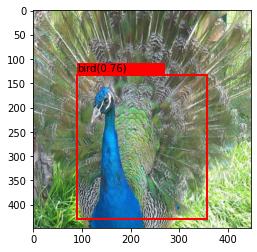

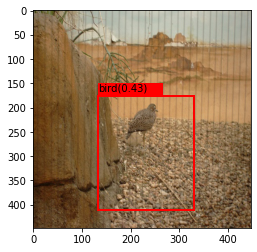

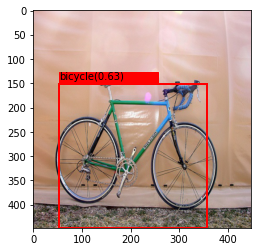

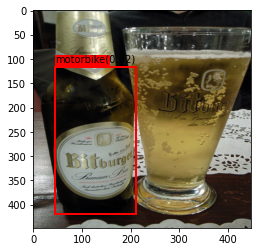

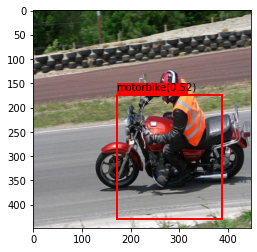

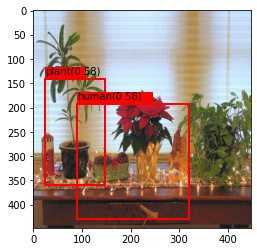

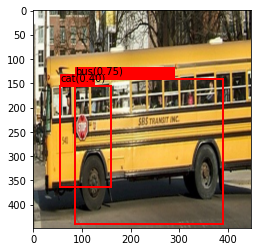

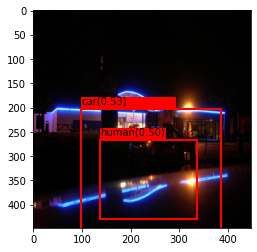

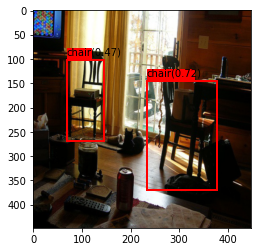

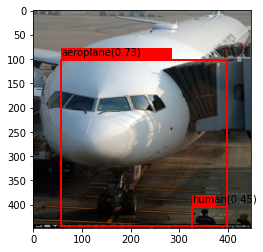

  0%|          | 0/94 [00:00<?, ?it/s]

Train Loop:



100%|██████████| 94/94 [00:37<00:00,  2.53it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 11 | train_loss: 95.45132977911767 | train_mAP: 0.355957567691803

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.56it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 12 | train_loss: 89.9817906643482 | train_mAP: 0.3883022964000702

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.57it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 13 | train_loss: 85.90506196529307 | train_mAP: 0.41021695733070374

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.56it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 14 | train_loss: 82.07264656716205 | train_mAP: 0.48960843682289124

Train Loop:



100%|██████████| 94/94 [00:37<00:00,  2.54it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 15 | train_loss: 82.30204764832841 | train_mAP: 0.45391374826431274

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 16 | train_loss: 79.86254919336197 | train_mAP: 0.5469682216644287

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 17 | train_loss: 72.69204322327958 | train_mAP: 0.5452295541763306

Train Loop:



100%|██████████| 94/94 [00:37<00:00,  2.54it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 18 | train_loss: 70.63379762527791 | train_mAP: 0.4804767072200775

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 19 | train_loss: 67.86596760851272 | train_mAP: 0.6080412864685059

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]

 epoch: 20 | train_loss: 66.10161578401606 | train_mAP: 0.5859726667404175

Displaying images...



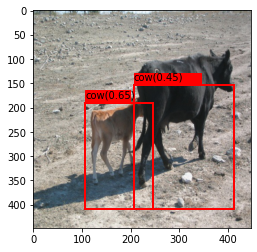

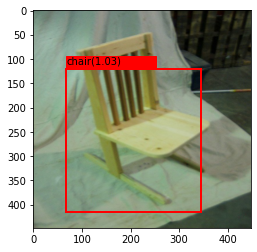

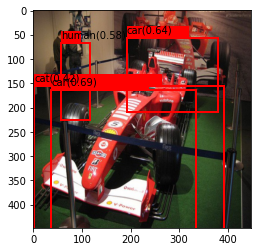

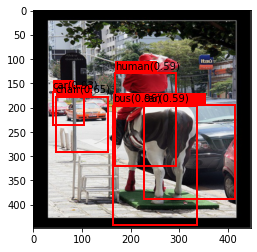

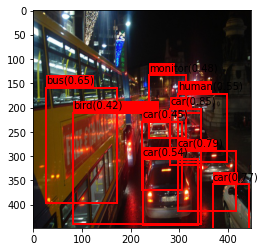

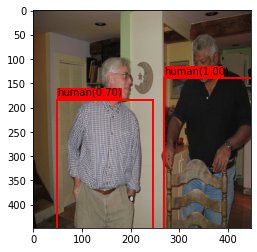

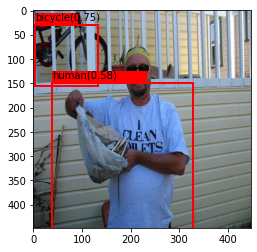

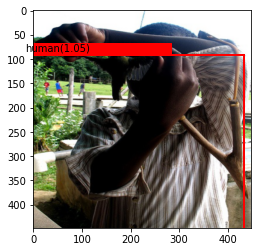

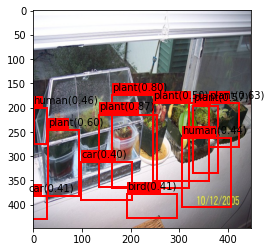

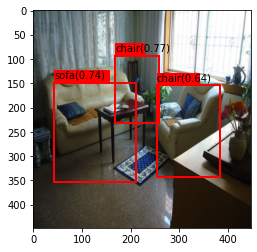

  0%|          | 0/94 [00:00<?, ?it/s]

Train Loop:



100%|██████████| 94/94 [00:37<00:00,  2.52it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 21 | train_loss: 71.04319527808656 | train_mAP: 0.5566645860671997

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.56it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 22 | train_loss: 67.18998807541867 | train_mAP: 0.5835672616958618

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.54it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 23 | train_loss: 62.99055058905419 | train_mAP: 0.6240621209144592

Train Loop:



100%|██████████| 94/94 [00:37<00:00,  2.54it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 24 | train_loss: 63.01638854818141 | train_mAP: 0.6286076307296753

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.56it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 25 | train_loss: 61.58738428481082 | train_mAP: 0.6811110973358154

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.56it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 26 | train_loss: 59.55201195655985 | train_mAP: 0.653980016708374

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.56it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 27 | train_loss: 56.602607585014184 | train_mAP: 0.6753906607627869

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.56it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 28 | train_loss: 51.88156016329501 | train_mAP: 0.6883882284164429

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.56it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 29 | train_loss: 50.98261887976464 | train_mAP: 0.6729378700256348

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.57it/s]

 epoch: 30 | train_loss: 51.45436558824905 | train_mAP: 0.6525598764419556

Displaying images...



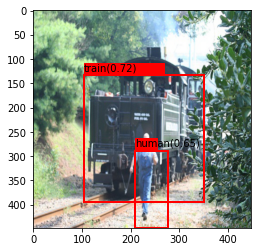

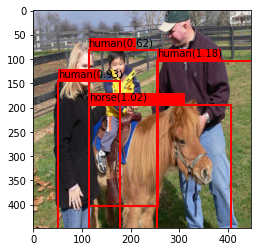

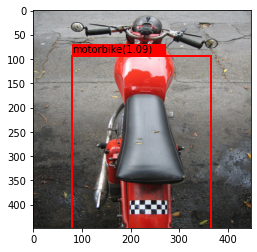

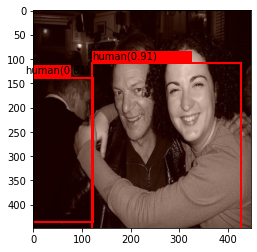

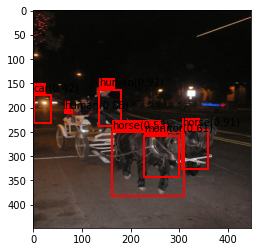

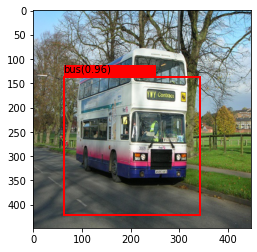

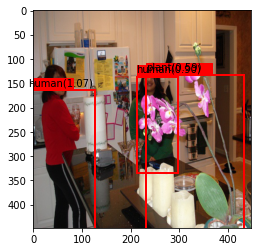

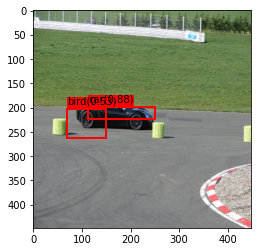

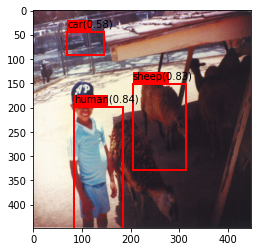

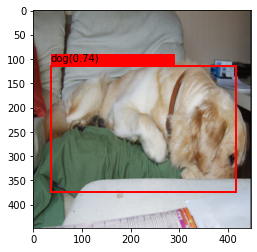

  0%|          | 0/94 [00:00<?, ?it/s]

Train Loop:



100%|██████████| 94/94 [00:37<00:00,  2.53it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 31 | train_loss: 50.925835203617176 | train_mAP: 0.6075751781463623

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 32 | train_loss: 50.91232245019142 | train_mAP: 0.6861464381217957

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 33 | train_loss: 49.06021534128392 | train_mAP: 0.6939418911933899

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 34 | train_loss: 48.1073762812513 | train_mAP: 0.7127193212509155

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.56it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 35 | train_loss: 45.528638271575275 | train_mAP: 0.7188669443130493

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 36 | train_loss: 44.39461659370585 | train_mAP: 0.702649712562561

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 37 | train_loss: 43.62859378977025 | train_mAP: 0.6928911209106445

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.54it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 38 | train_loss: 44.237582206726074 | train_mAP: 0.7370792627334595

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 39 | train_loss: 43.30522013725118 | train_mAP: 0.7292855381965637

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.56it/s]

 epoch: 40 | train_loss: 41.91915855001896 | train_mAP: 0.7355459928512573

Displaying images...



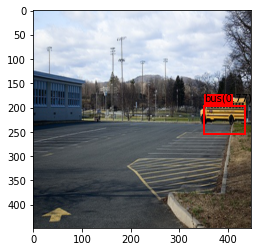

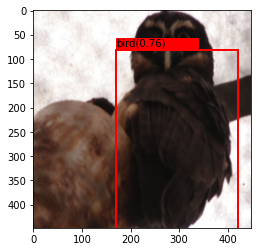

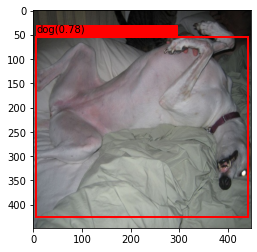

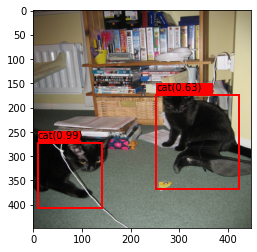

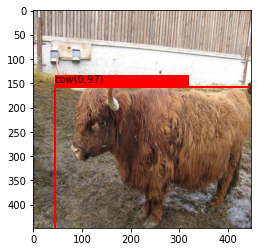

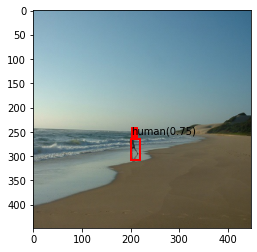

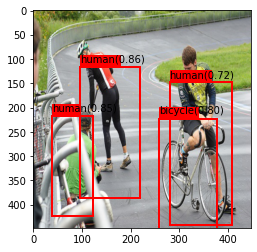

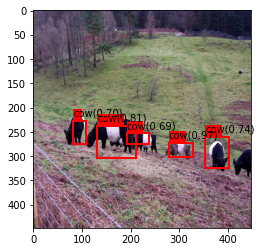

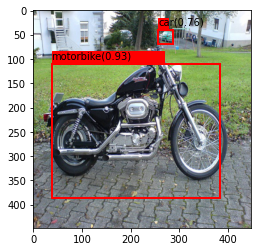

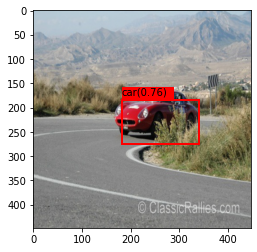

  0%|          | 0/94 [00:00<?, ?it/s]

Train Loop:



100%|██████████| 94/94 [00:37<00:00,  2.53it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 41 | train_loss: 40.35183896409704 | train_mAP: 0.723829984664917

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 42 | train_loss: 39.58555402147009 | train_mAP: 0.7691846489906311

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 43 | train_loss: 38.719070901262 | train_mAP: 0.7644436359405518

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 44 | train_loss: 38.92395573473991 | train_mAP: 0.7661109566688538

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 45 | train_loss: 37.79696062777905 | train_mAP: 0.7848505973815918

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 46 | train_loss: 36.82272326692622 | train_mAP: 0.7719394564628601

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.56it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 47 | train_loss: 36.00762478848721 | train_mAP: 0.7575567364692688

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.56it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 48 | train_loss: 35.1814862515064 | train_mAP: 0.8004027605056763

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.54it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 49 | train_loss: 34.475084872955975 | train_mAP: 0.7774127125740051

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]

 epoch: 50 | train_loss: 33.02119480295384 | train_mAP: 0.7990802526473999

Displaying images...



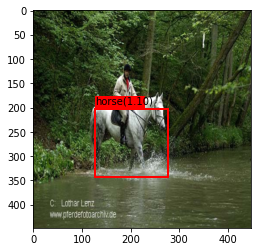

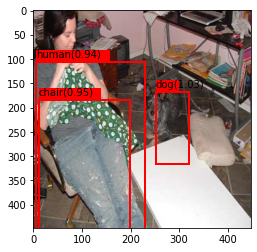

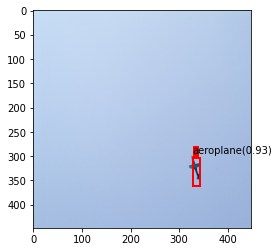

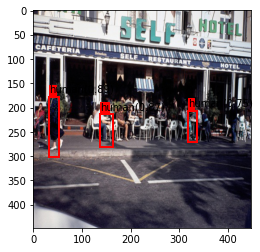

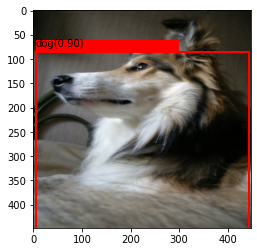

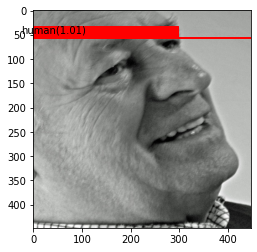

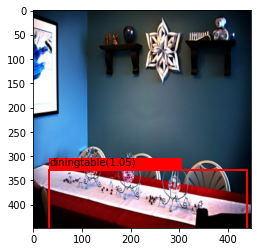

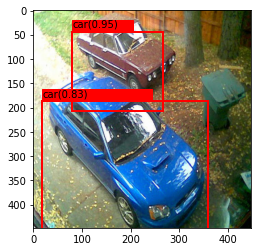

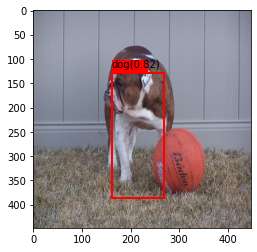

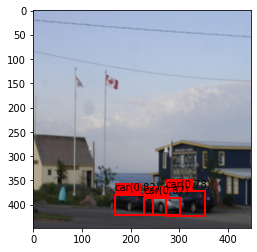

  0%|          | 0/94 [00:00<?, ?it/s]

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 51 | train_loss: 32.353401853683145 | train_mAP: 0.7925333976745605

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 52 | train_loss: 31.08908379331548 | train_mAP: 0.8147573471069336

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 53 | train_loss: 31.768261138429033 | train_mAP: 0.8002179265022278

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 54 | train_loss: 30.064176011592785 | train_mAP: 0.7762123942375183

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.56it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 55 | train_loss: 28.768826017988488 | train_mAP: 0.8204402923583984

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.56it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 56 | train_loss: 29.291014245215884 | train_mAP: 0.8212124705314636

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 57 | train_loss: 27.954173605492773 | train_mAP: 0.823807418346405

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 58 | train_loss: 27.551777474423673 | train_mAP: 0.7992521524429321

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 59 | train_loss: 27.503460163765766 | train_mAP: 0.7992167472839355

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]

 epoch: 60 | train_loss: 28.038344373094276 | train_mAP: 0.8218783140182495

Displaying images...



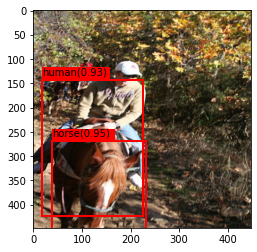

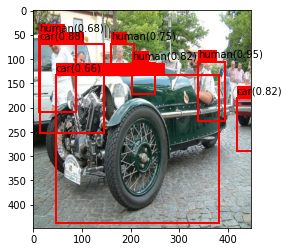

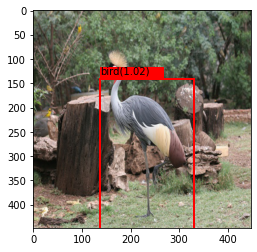

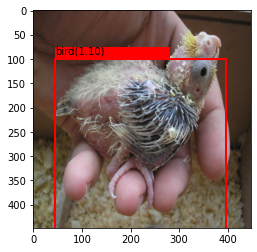

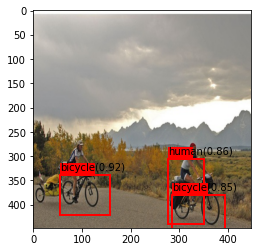

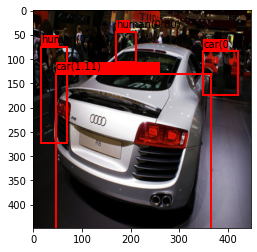

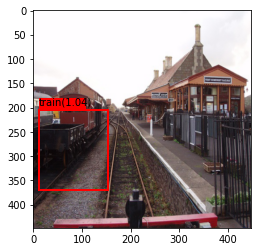

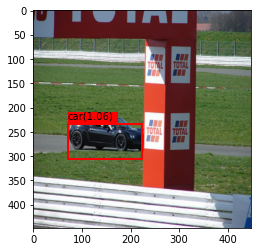

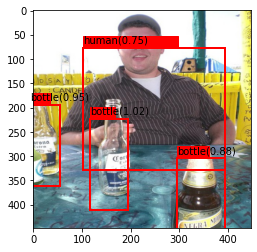

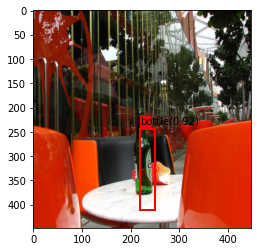

  0%|          | 0/94 [00:00<?, ?it/s]

Train Loop:



100%|██████████| 94/94 [00:37<00:00,  2.54it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 61 | train_loss: 27.548511535563367 | train_mAP: 0.8289562463760376

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 62 | train_loss: 27.08561814084966 | train_mAP: 0.793685793876648

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.56it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 63 | train_loss: 27.630362094716823 | train_mAP: 0.8122784495353699

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 64 | train_loss: 26.54817491896609 | train_mAP: 0.8026232719421387

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 65 | train_loss: 25.54298741766747 | train_mAP: 0.8203210830688477

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.56it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 66 | train_loss: 25.213650439647918 | train_mAP: 0.7966344952583313

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.58it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 67 | train_loss: 30.56077589887254 | train_mAP: 0.8156119585037231

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 68 | train_loss: 27.413476801933125 | train_mAP: 0.8270937204360962

Train Loop:



100%|██████████| 94/94 [00:37<00:00,  2.54it/s]


  0%|          | 0/94 [00:00<?, ?it/s]

 epoch: 69 | train_loss: 25.376901403386544 | train_mAP: 0.8309975862503052

Train Loop:



100%|██████████| 94/94 [00:36<00:00,  2.55it/s]

 epoch: 70 | train_loss: 24.031638338210733 | train_mAP: 0.852196216583252

Displaying images...



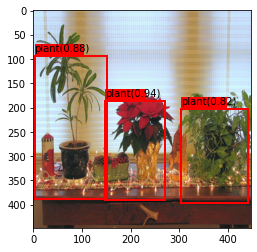

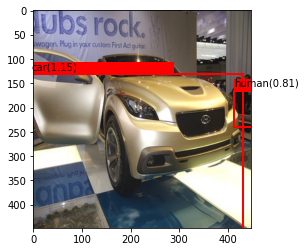

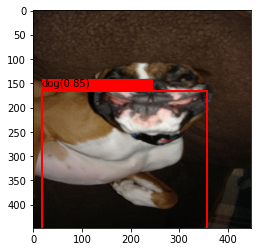

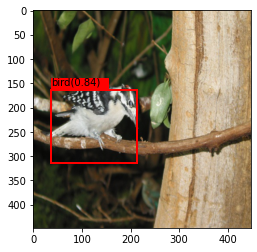

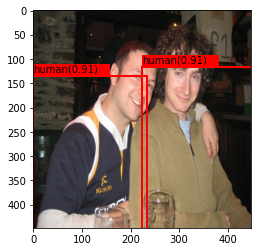

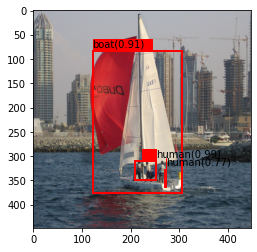

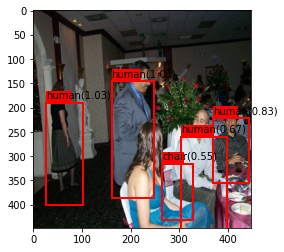

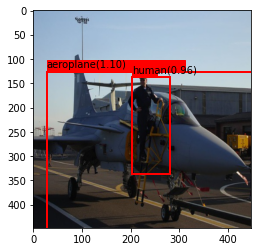

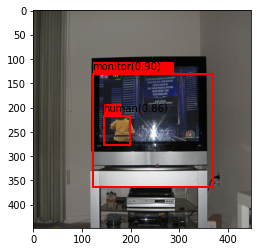

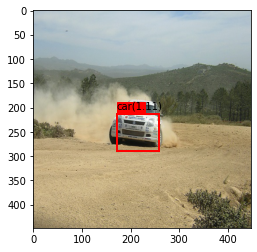

  0%|          | 0/94 [00:00<?, ?it/s]

Train Loop:



 13%|█▎        | 12/94 [00:05<00:36,  2.23it/s]


KeyboardInterrupt: ignored

In [32]:
for epoch in range(epochs):
    train_loss = loop(train_batches, net, opt, loss_fn, True, device)
    # test_loss = loop(test_batches, net, opt, loss_fn, False, device)

    train_pred_bboxes, train_true_bboxes = get_bboxes(net, train_batches, iou_threshold=0.5, prob_threshold=0.4, device=device)
    train_mAP = mean_average_precision(train_pred_bboxes, train_true_bboxes)

    # test_pred_bboxes, test_true_bboxes = get_bboxes(net, test_batches, iou_threshold=0.5, prob_threshold=0.4, device=device)
    # test_mAP = mean_average_precision(test_pred_bboxes, test_true_bboxes)

    # print(f"epoch: {epoch} | train_loss: {train_loss} | train_mAP: {train_mAP} | test_loss: {test_loss} | test_mAP: {test_mAP}")
    print(f" epoch: {epoch} | train_loss: {train_loss} | train_mAP: {train_mAP}")
    print("")

    if epoch % 10 == 0:
        # display_images(test_batches, net, class_dict)
        display_images(train_batches, net, class_dict)
        # save_checkpoint(net, opt, f"checkpoint_{epoch}.pth.tar")

Displaying images...



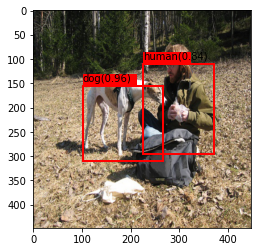

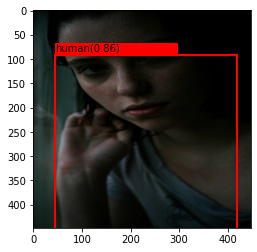

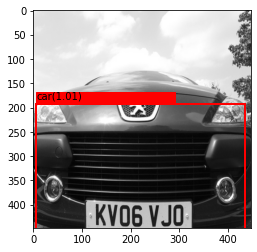

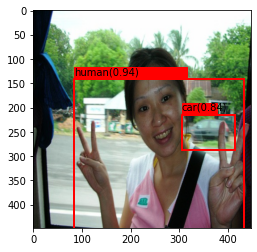

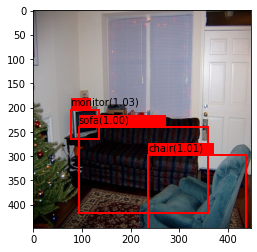

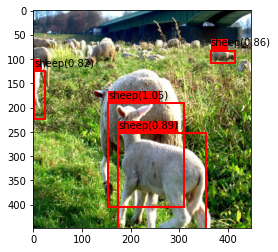

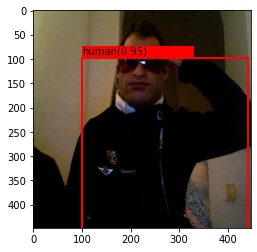

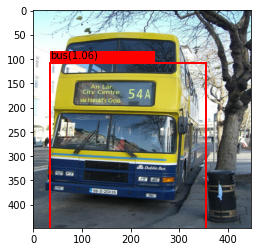

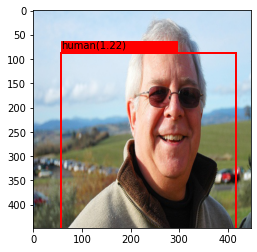

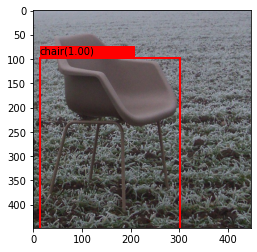

Displaying images...



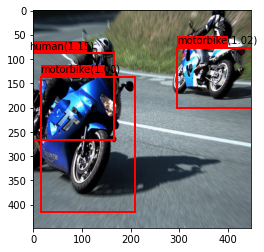

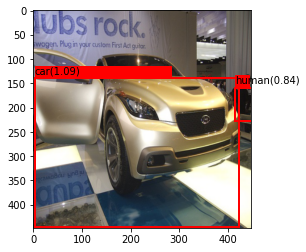

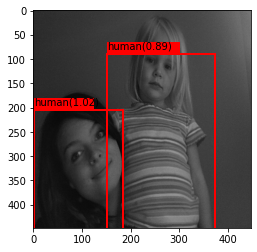

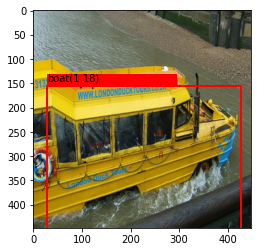

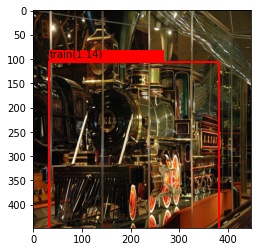

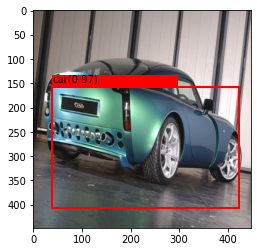

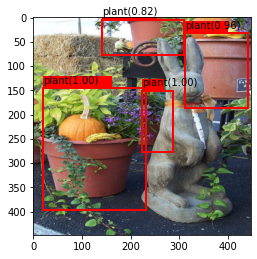

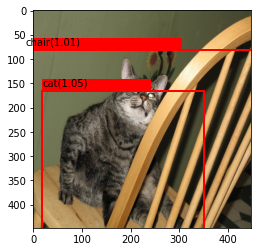

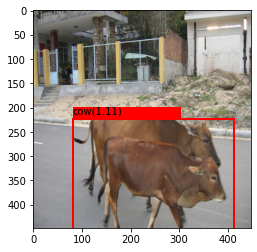

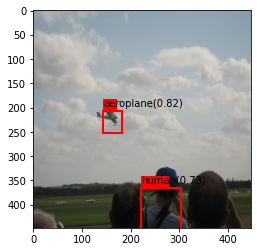

Displaying images...



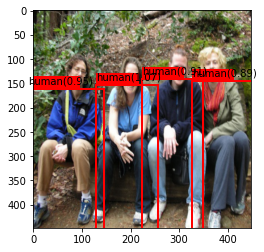

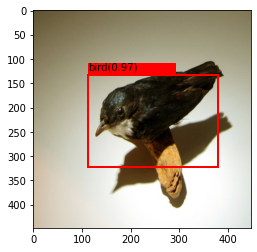

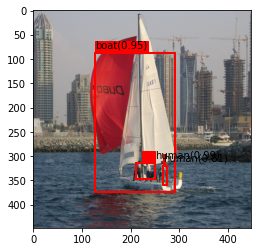

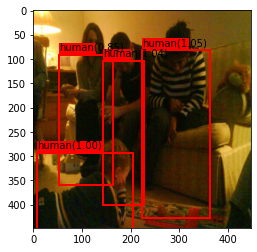

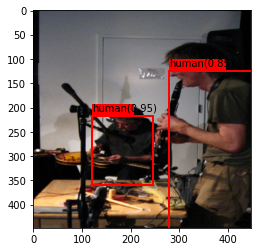

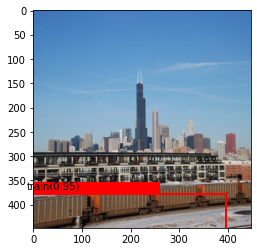

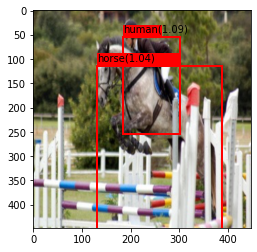

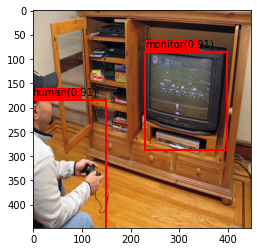

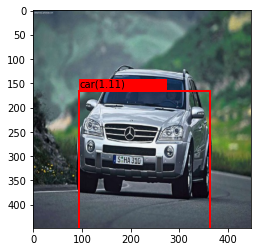

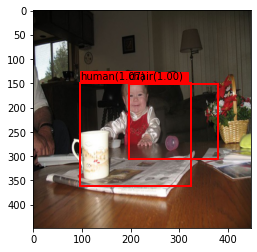

In [34]:
for _ in range(3):
    display_images(train_batches, net, class_dict)